In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
!pip install plotly
import plotly.express as px

In [2]:
df = pd.read_csv("dataset.csv")

In [3]:
df

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [4]:
df.head() ## Preview the first 5 rows of the dataset

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [5]:
df.info() # Get basic information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [6]:
df.describe() # Get summary statistics for numerical columns

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,112634.000000,112634.000000,112634.000000,112634.000000,112348.000000,1.126340e+05,1.126340e+05
mean,98156.226850,2019.003365,87.812987,1793.439681,29.805604,1.994567e+08,5.296650e+10
std,2648.733064,2.892364,102.334216,10783.753486,14.700545,9.398427e+07,1.699104e+09
min,1730.000000,1997.000000,0.000000,0.000000,1.000000,4.777000e+03,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,18.000000,1.484142e+08,5.303301e+10
50%,98119.000000,2020.000000,32.000000,0.000000,34.000000,1.923896e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191899e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.603300e+10


In [7]:
df.isnull().sum() #check for missing values

VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                      24
Electric Utility                                     443
2020 Census Tract                                      0
dtype: int64

In [8]:
# Renaming columns for clarity
df.rename(columns={
    'VIN (1-10)': 'vin',
    'County': 'county',
    'City': 'city',
    'State': 'state',
    'Postal Code': 'postal_code',
    'Model Year': 'model_year',
    'Make': 'make',
    'Model': 'model',
    'Electric Vehicle Type': 'ev_type',
    'Clean Alternative Fuel Vehicle (CAFV) Eligibility': 'cafv_eligibility',
    'Electric Range': 'electric_range',
    'Base MSRP': 'base_msrp',
    'Legislative District': 'legislative_district',
    'DOL Vehicle ID': 'dol_vehicle_id',
    'Vehicle Location': 'vehicle_location',
    'Electric Utility': 'electric_utility',
    '2020 Census Tract': 'census_tract'
}, inplace=True)

# Verify that the columns have been renamed
print(df.columns)


Index(['vin', 'county', 'city', 'state', 'postal_code', 'model_year', 'make',
       'model', 'ev_type', 'cafv_eligibility', 'electric_range', 'base_msrp',
       'legislative_district', 'dol_vehicle_id', 'vehicle_location',
       'electric_utility', 'census_tract'],
      dtype='object')


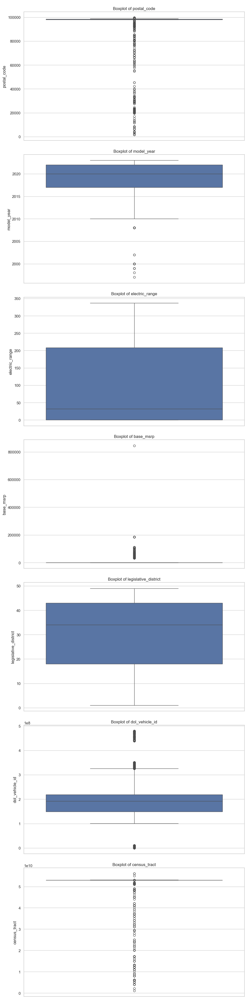

In [9]:
sns.set(style = "whitegrid")

numerical_cols =[
    'postal_code',
    'model_year',
    'electric_range',
    'base_msrp',
    'legislative_district',
    'dol_vehicle_id',
    'census_tract'
]

plt.figure(figsize=(10,40))
for i,col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols),1,i+1)
    sns.boxplot(y=df[col])
    plt.title(f'\nBoxplot of {col}')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

In [10]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Create instances of SimpleImputer
cat_imputer = SimpleImputer(strategy='most_frequent')
num_imputer = SimpleImputer(strategy='median')  # Using median for robustness

# Define columns to impute
cat_cols = ['model', 'vehicle_location', 'electric_utility']  # Ensure correct column names
num_cols = ['legislative_district']

# Impute categorical columns
for col in cat_cols:
    if col in df.columns:
        # Flattening the output to match the DataFrame structure
        df[col] = cat_imputer.fit_transform(df[[col]]).ravel()
    else:
        print(f"Column '{col}' not found in DataFrame.")

# Impute numerical columns
for col in num_cols:
    if col in df.columns:
        df[col] = num_imputer.fit_transform(df[[col]]).ravel()
    else:
        print(f"Column '{col}' not found in DataFrame.")

# Check for remaining missing values
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]  # Only show columns with missing values
print("Remaining missing values:\n", missing_values)


Remaining missing values:
 Series([], dtype: int64)


In [11]:
df.isnull().sum()

vin                     0
county                  0
city                    0
state                   0
postal_code             0
model_year              0
make                    0
model                   0
ev_type                 0
cafv_eligibility        0
electric_range          0
base_msrp               0
legislative_district    0
dol_vehicle_id          0
vehicle_location        0
electric_utility        0
census_tract            0
dtype: int64

In [12]:
df.isna().sum()

vin                     0
county                  0
city                    0
state                   0
postal_code             0
model_year              0
make                    0
model                   0
ev_type                 0
cafv_eligibility        0
electric_range          0
base_msrp               0
legislative_district    0
dol_vehicle_id          0
vehicle_location        0
electric_utility        0
census_tract            0
dtype: int64

## Univartiate Analysis

In [13]:
df.columns

Index(['vin', 'county', 'city', 'state', 'postal_code', 'model_year', 'make',
       'model', 'ev_type', 'cafv_eligibility', 'electric_range', 'base_msrp',
       'legislative_district', 'dol_vehicle_id', 'vehicle_location',
       'electric_utility', 'census_tract'],
      dtype='object')

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   vin                   112634 non-null  object 
 1   county                112634 non-null  object 
 2   city                  112634 non-null  object 
 3   state                 112634 non-null  object 
 4   postal_code           112634 non-null  int64  
 5   model_year            112634 non-null  int64  
 6   make                  112634 non-null  object 
 7   model                 112634 non-null  object 
 8   ev_type               112634 non-null  object 
 9   cafv_eligibility      112634 non-null  object 
 10  electric_range        112634 non-null  int64  
 11  base_msrp             112634 non-null  int64  
 12  legislative_district  112634 non-null  float64
 13  dol_vehicle_id        112634 non-null  int64  
 14  vehicle_location      112634 non-nul

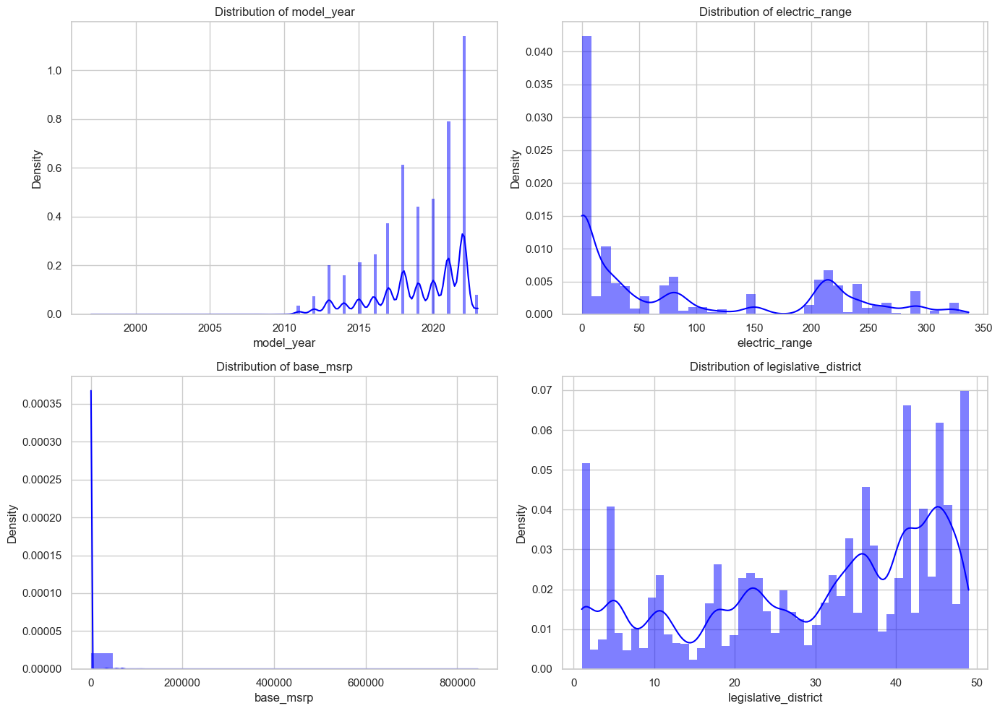


Categorical Analysis:


Value Counts for county:
county
King          59000
Snohomish     12434
Pierce         8535
Clark          6689
Thurston       4126
              ...  
Pinal             1
Elmore            1
Portsmouth        1
Kings             1
Kootenai          1
Name: count, Length: 165, dtype: int64

Value Counts for city:
city
Seattle         20305
Bellevue         5921
Redmond          4201
Vancouver        4013
Kirkland         3598
                ...  
Hartline            1
Gaithersburg        1
El Paso             1
Klickitat           1
Worley              1
Name: count, Length: 629, dtype: int64

Value Counts for state:
state
WA    112348
CA        76
VA        36
MD        26
TX        14
CO         9
NV         8
GA         7
NC         7
CT         6
DC         6
FL         6
AZ         6
IL         6
SC         5
OR         5
NE         5
HI         4
UT         4
AR         4
NY         4
TN         3
KS         3
MO         3
PA         3
MA         3
LA   

C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1667875076.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='viridis')
C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1667875076.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='viridis')
C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1667875076.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette=

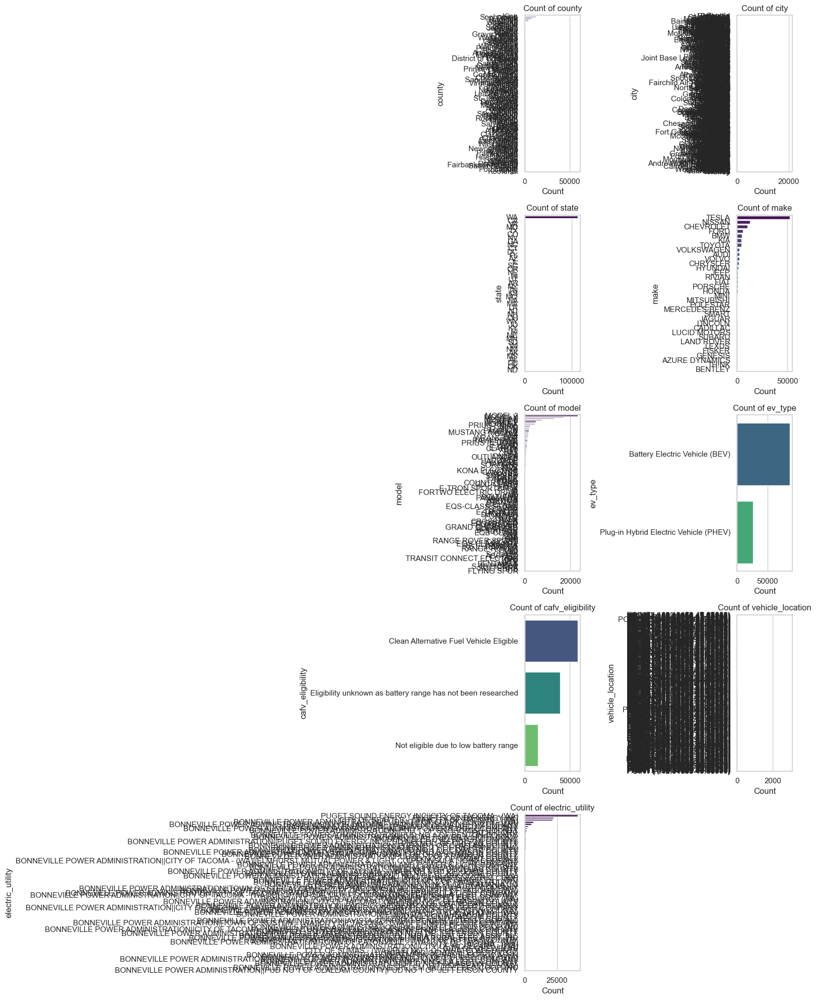

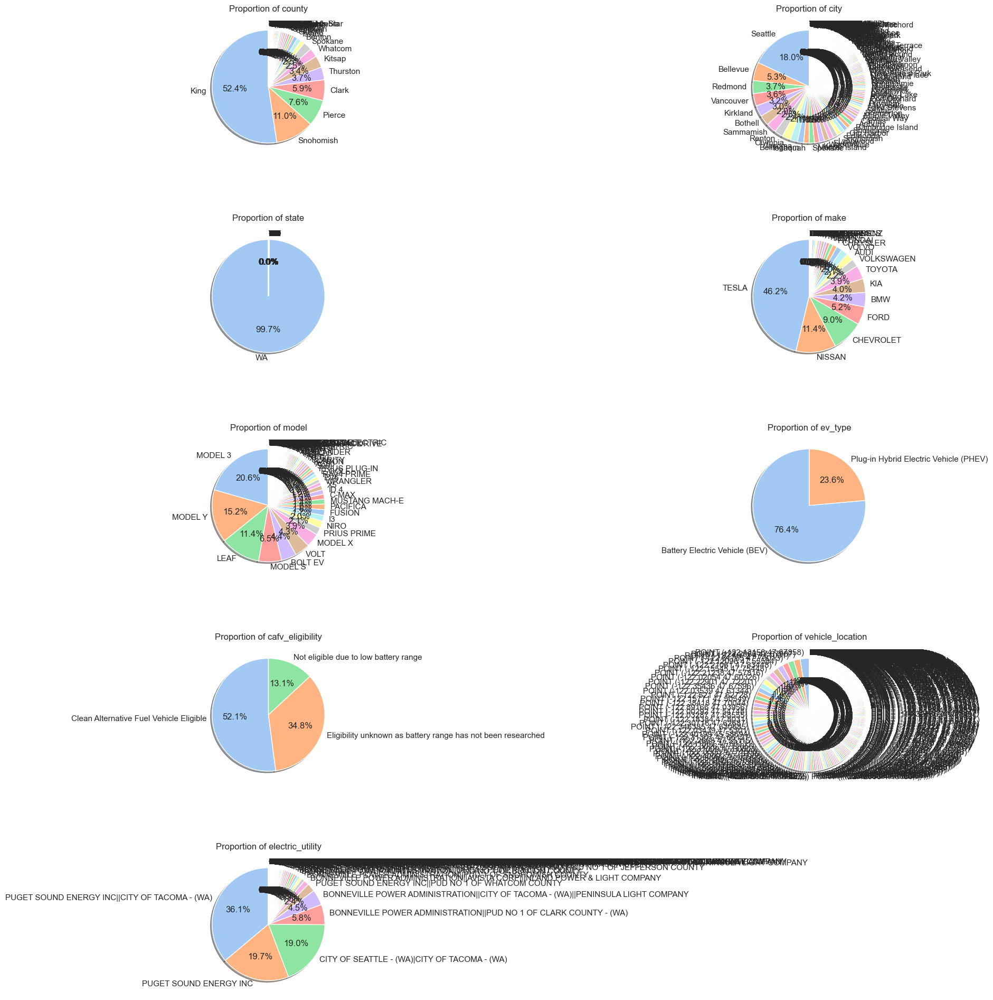

In [14]:
# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Segregate columns into numerical and categorical
num_cols = ['model_year', 'electric_range', 'base_msrp', 'legislative_district']
cat_cols = ['county', 'city', 'state', 'make', 'model', 'ev_type', 'cafv_eligibility', 'vehicle_location', 'electric_utility']

# Display DataFrame info for a quick overview
print("DataFrame Info:")
print(df.info())

# ========================== Numerical Analysis ==========================
print("\nNumerical Analysis:\n")
# Summary Statistics for Numerical Columns
num_summary = df[num_cols].describe()
print(num_summary)

# Create a figure for numerical distributions
plt.figure(figsize=(14, 10))

# Plotting distributions for numerical columns
for i, col in enumerate(num_cols, 1):
    plt.subplot(2, 2, i)
    sns.histplot(df[col], kde=True, stat='density', linewidth=0, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()

# ========================== Categorical Analysis ==========================
print("\nCategorical Analysis:\n")

# Display Value Counts for Categorical Columns
for col in cat_cols:
    print(f"\nValue Counts for {col}:\n{df[col].value_counts()}")

# Create a figure for categorical distributions
plt.figure(figsize=(16, 20))

# Bar charts for categorical columns
for i, col in enumerate(cat_cols, 1):
    plt.subplot(5, 2, i)
    sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='viridis')
    plt.title(f'Count of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

# Pie Charts for Categorical Columns
plt.figure(figsize=(16, 20))

for i, col in enumerate(cat_cols, 1):
    plt.subplot(5, 2, i)
    df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, shadow=True, colors=sns.color_palette("pastel"))
    plt.title(f'Proportion of {col}')
    plt.ylabel('')  # Hide the y-label for better appearance

plt.tight_layout()
plt.show()


In [15]:
# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Segregate columns into numerical and categorical
num_cols = ['model_year', 'electric_range', 'base_msrp', 'legislative_district']
cat_cols = ['county', 'city', 'state', 'make', 'model', 'ev_type', 'cafv_eligibility', 'vehicle_location', 'electric_utility']

# Display DataFrame info for a quick overview
print("DataFrame Info:")
print(df.info())

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   vin                   112634 non-null  object 
 1   county                112634 non-null  object 
 2   city                  112634 non-null  object 
 3   state                 112634 non-null  object 
 4   postal_code           112634 non-null  int64  
 5   model_year            112634 non-null  int64  
 6   make                  112634 non-null  object 
 7   model                 112634 non-null  object 
 8   ev_type               112634 non-null  object 
 9   cafv_eligibility      112634 non-null  object 
 10  electric_range        112634 non-null  int64  
 11  base_msrp             112634 non-null  int64  
 12  legislative_district  112634 non-null  float64
 13  dol_vehicle_id        112634 non-null  int64  
 14  vehicle_location      112634 non-nul

In [16]:
# ========================== Numerical Analysis ==========================
print("\nNumerical Analysis:\n")
# Summary Statistics for Numerical Columns
num_summary = df[num_cols].describe()
print(num_summary)


Numerical Analysis:

          model_year  electric_range      base_msrp  legislative_district
count  112634.000000   112634.000000  112634.000000         112634.000000
mean     2019.003365       87.812987    1793.439681             29.816254
std         2.892364      102.334216   10783.753486             14.683387
min      1997.000000        0.000000       0.000000              1.000000
25%      2017.000000        0.000000       0.000000             18.000000
50%      2020.000000       32.000000       0.000000             34.000000
75%      2022.000000      208.000000       0.000000             43.000000
max      2023.000000      337.000000  845000.000000             49.000000


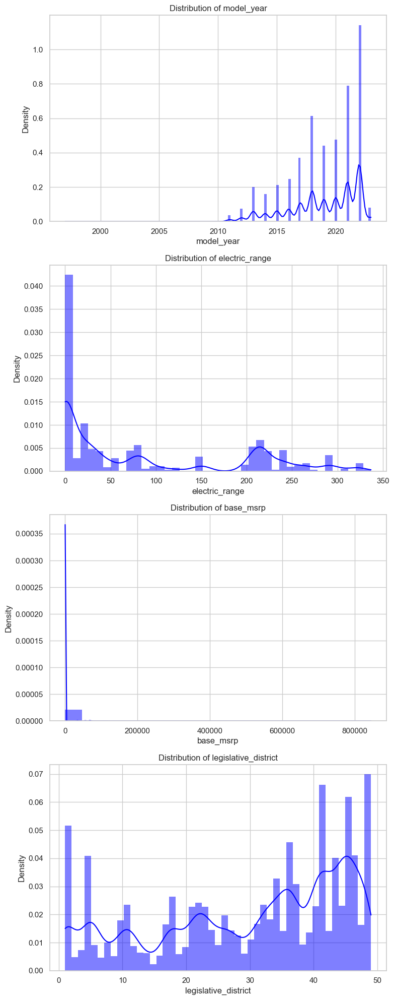

In [17]:
# Create a figure for numerical distributions with one plot below another
plt.figure(figsize=(8, 20))  # Adjusting figure height for multiple plots

# Plotting distributions for numerical columns in a single column
for i, col in enumerate(num_cols, 1):
    plt.subplot(len(num_cols), 1, i)  # Change to (len(num_cols), 1) for a single column layout
    sns.histplot(df[col], kde=True, stat='density', linewidth=0, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()


In [18]:
# ========================== Categorical Analysis ==========================
print("\nCategorical Analysis:\n")

# Display Value Counts for Categorical Columns
for col in cat_cols:
    print(f"\nValue Counts for {col}:\n{df[col].value_counts()}")




Categorical Analysis:


Value Counts for county:
county
King          59000
Snohomish     12434
Pierce         8535
Clark          6689
Thurston       4126
              ...  
Pinal             1
Elmore            1
Portsmouth        1
Kings             1
Kootenai          1
Name: count, Length: 165, dtype: int64

Value Counts for city:
city
Seattle         20305
Bellevue         5921
Redmond          4201
Vancouver        4013
Kirkland         3598
                ...  
Hartline            1
Gaithersburg        1
El Paso             1
Klickitat           1
Worley              1
Name: count, Length: 629, dtype: int64

Value Counts for state:
state
WA    112348
CA        76
VA        36
MD        26
TX        14
CO         9
NV         8
GA         7
NC         7
CT         6
DC         6
FL         6
AZ         6
IL         6
SC         5
OR         5
NE         5
HI         4
UT         4
AR         4
NY         4
TN         3
KS         3
MO         3
PA         3
MA         3
LA   

C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1128809392.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='viridis')
C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1128809392.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='viridis')
C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1128809392.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='vi

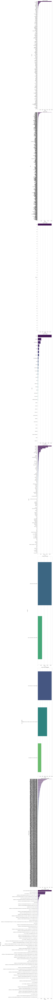

In [19]:
# Create a figure for categorical distributions with larger size
plt.figure(figsize=(16, 300))  # Increase height for better visibility

# Bar charts for categorical columns
for i, col in enumerate(cat_cols, 1):
    plt.subplot(len(cat_cols), 1, i)
    sns.countplot(data=df, y=col, order=df[col].value_counts().index, palette='viridis')
    plt.title(f'Count of {col}', fontsize=16)  # Increase title font size
    plt.xlabel('Count', fontsize=14)  # Increase x-axis label font size
    plt.ylabel(col, fontsize=14)  # Increase y-axis label font size
    plt.tick_params(axis='both', which='major', labelsize=12)  # Increase tick label size

plt.tight_layout()
plt.show()


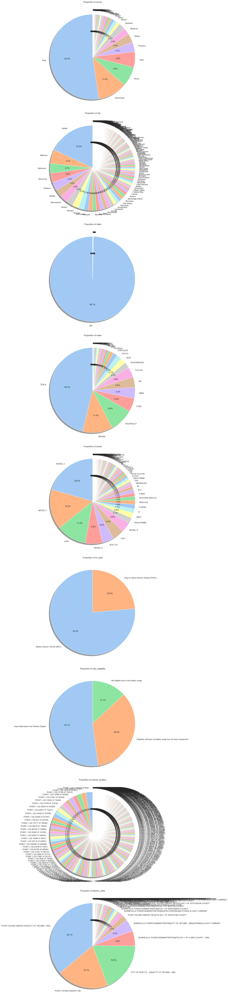

In [20]:
# Pie Charts for Categorical Columns
plt.figure(figsize=(16, 80))

for i, col in enumerate(cat_cols, 1):
    plt.subplot(len(cat_cols), 1, i)
    df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, shadow=True, colors=sns.color_palette("pastel"))
    plt.title(f'Proportion of {col}')
    plt.ylabel('')  # Hide the y-label for better appearance

plt.tight_layout()
plt.show()

## Bivariate Analysis

In [21]:
# Which state has the highest number of battery electric vehicles (BEVs)
#and the least number of plug-in hybrid electric vehicles (PHEVs)?

<Figure size 1200x600 with 0 Axes>

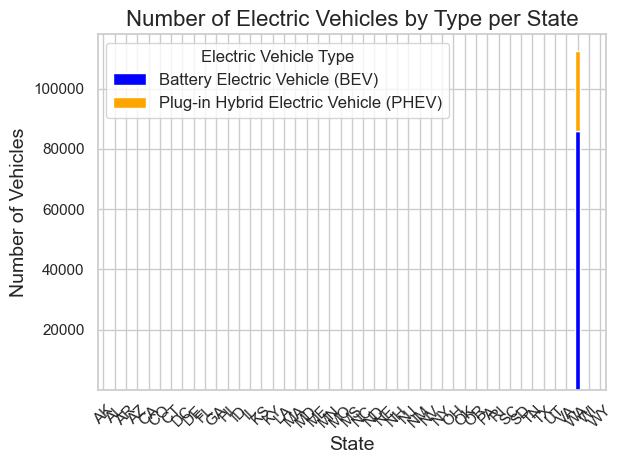

The state with the highest number of Battery Electric Vehicles (BEVs): WA
The state with the least number of Plug-in Hybrid Electric Vehicles (PHEVs): DE


In [22]:
# Filter data for BEVs and PHEVs
ev_counts = df[df['ev_type'].isin(['Battery Electric Vehicle (BEV)', 'Plug-in Hybrid Electric Vehicle (PHEV)'])]

# Group by State and Electric Vehicle Type
state_ev_counts = ev_counts.groupby(['state', 'ev_type']).size().unstack(fill_value=0)

# Plot the results
plt.figure(figsize=(12, 6))
state_ev_counts.plot(kind='bar', stacked=True, color=['blue', 'orange'])
plt.title('Number of Electric Vehicles by Type per State', fontsize=16)
plt.xlabel('State', fontsize=14)
plt.ylabel('Number of Vehicles', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Electric Vehicle Type', fontsize=12)
plt.tight_layout()
plt.show()

# Find the state with the highest number of BEVs and the least number of PHEVs
highest_bev = state_ev_counts['Battery Electric Vehicle (BEV)'].idxmax()
least_phev = state_ev_counts['Plug-in Hybrid Electric Vehicle (PHEV)'].idxmin()

print(f"The state with the highest number of Battery Electric Vehicles (BEVs): {highest_bev}")
print(f"The state with the least number of Plug-in Hybrid Electric Vehicles (PHEVs): {least_phev}")


In [23]:
#How does the base MSRP (Manufacturer's Suggested Retail Price) 
#vary across different electric vehicle types?

C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\1949061283.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='ev_type', y='base_msrp', palette='Set2')


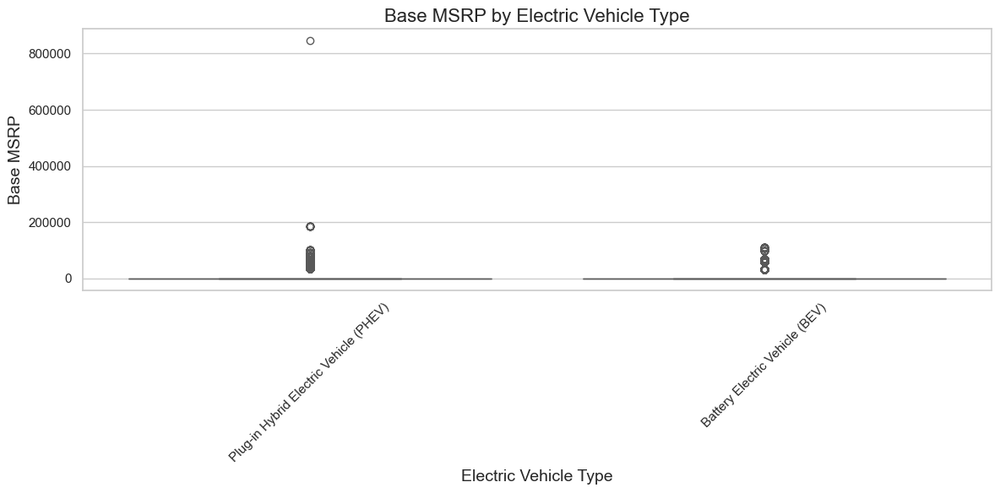

In [24]:
# Set the style of seaborn
sns.set(style="whitegrid")

# Create a box plot for Base MSRP by Electric Vehicle Type
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='ev_type', y='base_msrp', palette='Set2')
plt.title('Base MSRP by Electric Vehicle Type', fontsize=16)
plt.xlabel('Electric Vehicle Type', fontsize=14)
plt.ylabel('Base MSRP', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [25]:
# Is there a correlation between electric range and base MSRP?

Correlation between Electric Range and Base MSRP: 0.09


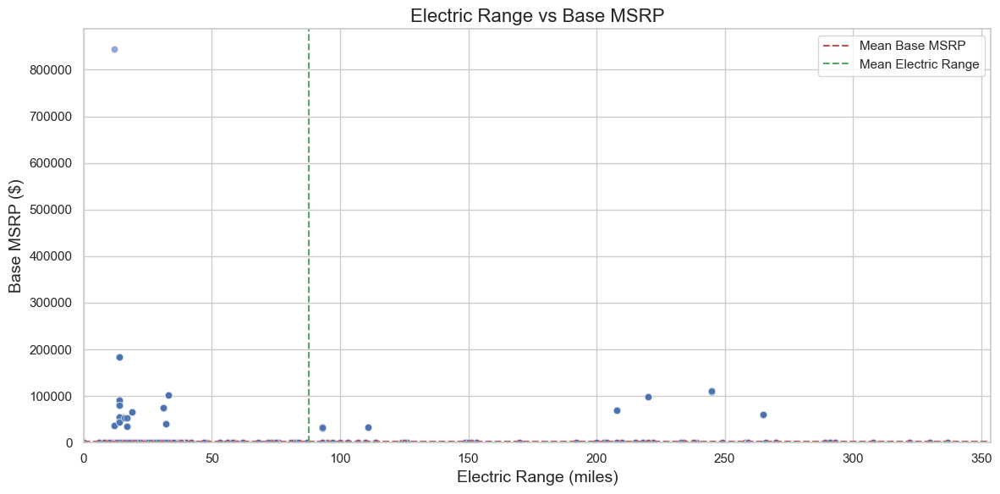

In [26]:
from scipy.stats import pearsonr

# Calculate the correlation coefficient
correlation, _ = pearsonr(df['electric_range'], df['base_msrp'])
print(f"Correlation between Electric Range and Base MSRP: {correlation:.2f}")

# Set the style of seaborn
sns.set(style="whitegrid")

# Create a scatter plot for Electric Range vs Base MSRP
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='electric_range', y='base_msrp', alpha=0.6)
plt.title('Electric Range vs Base MSRP', fontsize=16)
plt.xlabel('Electric Range (miles)', fontsize=14)
plt.ylabel('Base MSRP ($)', fontsize=14)
plt.xlim(left=0)  # Ensure the x-axis starts from 0
plt.ylim(bottom=0)  # Ensure the y-axis starts from 0
plt.axhline(y=df['base_msrp'].mean(), color='r', linestyle='--', label='Mean Base MSRP')
plt.axvline(x=df['electric_range'].mean(), color='g', linestyle='--', label='Mean Electric Range')
plt.legend()
plt.tight_layout()
plt.show()


In [27]:
# What is the distribution of electric vehicles by make across different states?

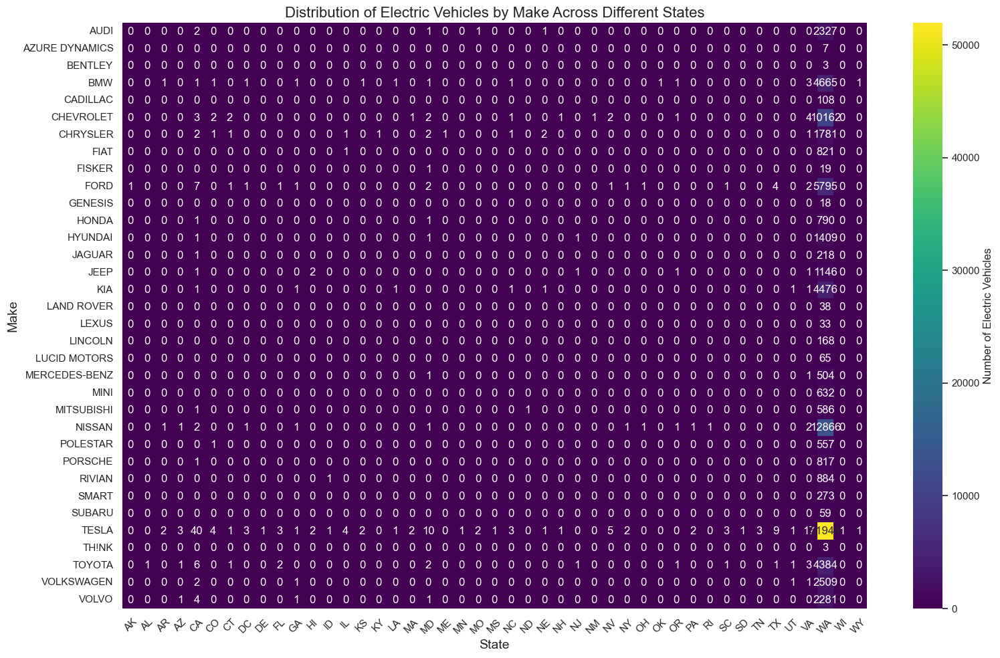

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Grouping the data to get counts of makes per state
make_state_counts = df.groupby(['make', 'state']).size().reset_index(name='count')

# Create a pivot table for better visualization using pivot_table
pivot_table = make_state_counts.pivot_table(index='make', columns='state', values='count', fill_value=0)

# Plotting
plt.figure(figsize=(16, 10))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap='viridis', cbar_kws={'label': 'Number of Electric Vehicles'})
plt.title('Distribution of Electric Vehicles by Make Across Different States', fontsize=16)
plt.xlabel('State', fontsize=14)
plt.ylabel('Make', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [29]:
# How does the average electric range differ between BEVs and PHEVs?

Unique values in 'ev_type': ['Plug-in Hybrid Electric Vehicle (PHEV)' 'Battery Electric Vehicle (BEV)']
Missing values in 'ev_type': 0
Filtered DataFrame (first few rows):
                                  ev_type  electric_range
0  PLUG-IN HYBRID ELECTRIC VEHICLE (PHEV)              42
1  PLUG-IN HYBRID ELECTRIC VEHICLE (PHEV)              38
2          BATTERY ELECTRIC VEHICLE (BEV)              73
3          BATTERY ELECTRIC VEHICLE (BEV)             238
4  PLUG-IN HYBRID ELECTRIC VEHICLE (PHEV)              26


C:\Users\Admin\AppData\Local\Temp\ipykernel_4032\708563818.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='ev_type', y='electric_range', data=average_range, palette='viridis')


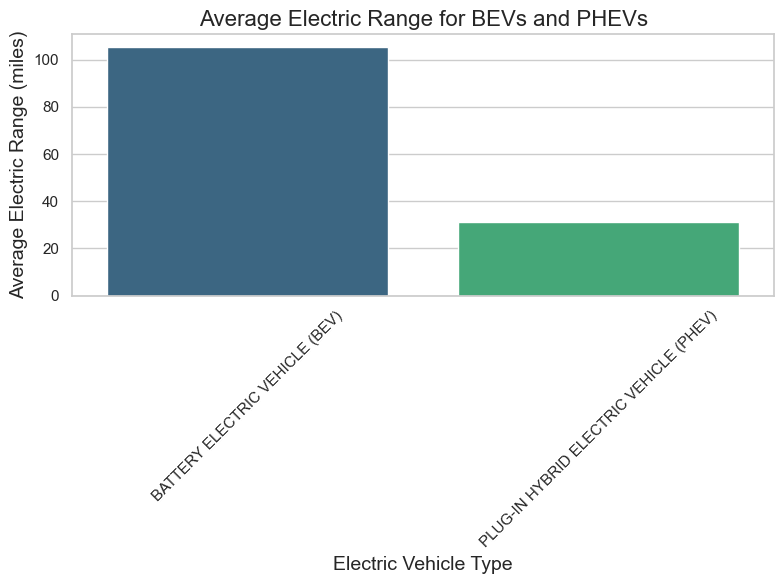

                                  ev_type  electric_range
0          BATTERY ELECTRIC VEHICLE (BEV)      105.369671
1  PLUG-IN HYBRID ELECTRIC VEHICLE (PHEV)       31.000376


In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already defined
# Step 1: Check unique values in 'ev_type'
print("Unique values in 'ev_type':", df['ev_type'].unique())

# Step 2: Clean the 'ev_type' column (if necessary)
df['ev_type'] = df['ev_type'].str.strip().str.upper()  # Normalize casing and strip whitespace

# Step 3: Check for missing values in 'ev_type'
print("Missing values in 'ev_type':", df['ev_type'].isnull().sum())

# Step 4: Filter for BEVs and PHEVs using the exact names
ev_types = df[df['ev_type'].isin(['PLUG-IN HYBRID ELECTRIC VEHICLE (PHEV)', 'BATTERY ELECTRIC VEHICLE (BEV)'])]
print("Filtered DataFrame (first few rows):")
print(ev_types[['ev_type', 'electric_range']].head())  # Display first few rows for verification

# Step 5: Group by vehicle type and calculate average electric range
if not ev_types.empty:
    average_range = ev_types.groupby('ev_type')['electric_range'].mean().reset_index()

    # Step 6: Plot the results
    plt.figure(figsize=(8, 6))
    sns.barplot(x='ev_type', y='electric_range', data=average_range, palette='viridis')
    plt.title('Average Electric Range for BEVs and PHEVs', fontsize=16)
    plt.xlabel('Electric Vehicle Type', fontsize=14)
    plt.ylabel('Average Electric Range (miles)', fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Print the average ranges for BEVs and PHEVs
    print(average_range)
else:
    print("No data found for BEVs and PHEVs.")


## Task 2: Create a Choropleth using plotly.express to display the number of EV vehicles based on location.

In [31]:
import plotly.express as px
import pandas as pd

# Assuming df is your DataFrame with the EV data already loaded

# Group by state and count the number of EVs
state_data = df.groupby('state')['vin'].count().reset_index()
state_data.columns = ['State', 'EV Count']  # Rename columns for clarity

# Create the choropleth
fig = px.choropleth(
    state_data,
    locations='State',  # Reference the renamed column 'State'
    locationmode='USA-states',
    color='EV Count',
    color_continuous_scale='greens',
    scope='usa',
    labels={'EV Count': 'Number of EV Vehicles'},
    title='Number of Electric Vehicles by State',
)

# Show the figure
fig.show()


## Task 3: Create a Racing Bar Plot to display the animation of EV Make and its count each year.

In [32]:
!pip install bar-chart-race

In [33]:
import bar_chart_race as bcr

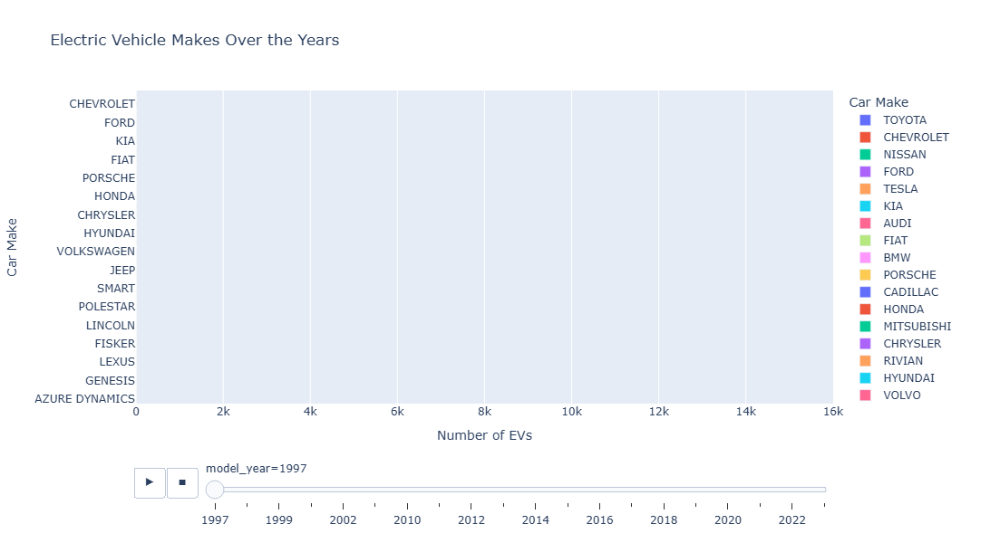

In [34]:
import pandas as pd
import bar_chart_race as bcr
import plotly.express as px

# Step 1: Group the data by 'Model Year' and 'Make' to get counts
ev_make_by_year = df.groupby(['model_year', 'make']).size().reset_index(name='EV Count')

# Step 2: Create a list of all unique makes
unique_makes = df['make'].unique()

# Step 3: Ensure all makes appear in every year by filling missing combinations
all_years = pd.DataFrame({'model_year': sorted(df['model_year'].unique())})

# Create all combinations of all years and unique makes
all_combinations = all_years.assign(key=1).merge(
    pd.DataFrame({'make': unique_makes, 'key': 1}), on='key'
).drop('key', axis=1)

# Merge with the original counts to fill missing combinations with 0
ev_make_by_year_full = all_combinations.merge(ev_make_by_year, on=['model_year', 'make'], how='left').fillna(0)

# Step 4: Convert EV Count to integer
ev_make_by_year_full['EV Count'] = ev_make_by_year_full['EV Count'].astype(int)

# Step 5: Create the animated racing bar plot
fig = px.bar(
    ev_make_by_year_full,
    x='EV Count',  # X-axis shows the count of EVs
    y='make',      # Y-axis shows the car Make
    color='make',  # Color by car Make
    animation_frame='model_year',  # Animation by year
    orientation='h',  # Horizontal bar chart
    title='Electric Vehicle Makes Over the Years',
    labels={'EV Count': 'Number of EVs', 'make': 'Car Make'},  # Axis Labels
)

# Set dynamic x-axis range
fig.update_xaxes(range=[0, ev_make_by_year_full['EV Count'].max() * 1.1])

# Increase height for better visibility
fig.update_layout(height=600)  # You can adjust the height as needed

# Step 6: Show the plot
fig.show()


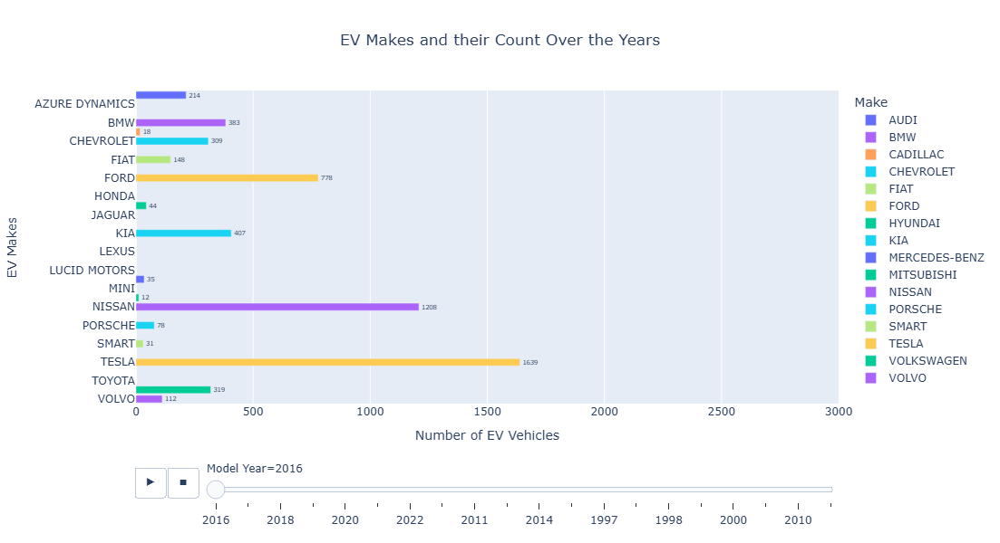

In [35]:
import pandas as pd
import plotly.express as px

df = pd.read_csv('dataset.csv')
d = df.groupby(['Make', 'Model Year']).size().reset_index(name='Number_of_Vehicles')
px.bar(d, x='Number_of_Vehicles',y='Make', color = 'Make', animation_frame = 'Model Year', orientation = 'h', 
       title = 'EV Makes and their Count Over the Years', range_x = [0, 3000]).update_traces(
    texttemplate = '%{x}', textposition = 'outside').update_layout(
    yaxis_title = 'EV Makes', xaxis_title = 'Number of EV Vehicles', title_x = 0.5, width = 800, height = 600).show()